In [ ]:
import numpy as np
from data import SimpleDataLoader
from app.utils.training import SimpleTrainer

# Reading Txt data

In [2]:
# Loading the data
data_loader = SimpleDataLoader()
texts = data_loader.load_text_file("training_data.txt")
texts = data_loader.clean_text(texts)
print(texts)

From fairest creatures we desire increase, That thereby beauty's rose might never die, But as the riper should by time decease, His tender heir might bear his memory: But thou contracted to thine own bright eyes, Feed'st thy light's flame with self-substantial fuel, Making a famine where abundance lies, Thy self thy foe, to thy sweet self too cruel: Thou that art now the world's fresh ornament, And only herald to the gaudy spring, Within thine own bud buriest thy content, And tender churl mak'st waste in niggarding: Pity the world, or else this glutton be, To eat the world's due, by the grave and thee. 2 When forty winters shall besiege thy brow, And dig deep trenches in thy beauty's field, Thy youth's proud livery so gazed on now, Will be a tattered weed of small worth held: Then being asked, where all thy beauty lies, Where all the treasure of thy lusty days; To say within thine own deep sunken eyes, Were an all-eating shame, and thriftless praise. How much more praise deserved thy b

# Tokenization using bpe

# Byte Pair Encoding (BPE) Explanation

Byte Pair Encoding (BPE) is a subword tokenization algorithm used in modern NLP systems that works by:

1. **Starting with characters**: Initializes vocabulary with individual characters
2. **Iterative merging**: Repeatedly finds the most frequent pair of adjacent tokens and merges them into a new token
3. **Building vocabulary**: Creates a vocabulary of subword units, from characters to common sequences

In [3]:
global vocab
global id_to_token
global merges
# Tokenizer bpe
special_tokens = {
            "<PAD>": 0,
            "<BOS>": 1, # bagain of sentence
            "<EOS>": 2, # End of sentence
            "<UNK>": 3 # unknown
        }
vocab = {**special_tokens}
print(f"Special characters Vocab {vocab}")
print(f"Special characters {list(vocab.keys())[0]} : {list(vocab.values())[0]}")

# ASCII characters (a~z, A~Z, 0~9, etc...)
for i in range(32, 127):  
            vocab[chr(i)] = len(vocab)
print(f"ASCII included Vocab {vocab}")
print(f"ASCII included {list(vocab.keys())[5]} : {list(vocab.values())[5]}")
# Create a reverse mapping
id_to_token = {v: k for k, v in vocab.items()}
print(f"ASCII reverse Vocab {id_to_token}")
print(f"ASCII Reverse Vocab {list(id_to_token.keys())[5]} : {list(id_to_token.values())[5]}")
        
# Encode 
def Encode(text):
    encoded = [vocab["<BOS>"]]
    for char in text:
        if char in vocab:
            encoded.append(vocab[char])
        else:
            encoded.append(vocab["<UNK>"])
    encoded.append(vocab["<EOS>"])
    return encoded
print(f"raw text :{texts[:30]}")
print(f"Encoded tokens :{Encode(texts[:30])}")
# Decode
def Decode(encoded_list):
    text=""
    for token in encoded_list:
        if token in special_tokens.values():
            continue
        text+=id_to_token[(token)]
    return text
print(f"Decoded tokens :{Decode(Encode(texts[:30]))}")

         
         
# Merging 
merges = {}
# we want to merge most repeted pair and add the to vocab and inverse vocab 
def merge_pair(token1, token2):
    # check if both exist
    merged = token1 + token2
    merges[(token1, token2)] = merged    
    vocab[merged] = len(vocab)
    id_to_token[vocab[merged]] = merged

# Learn
def bpe(texts, num_merges=500):
    pairs    = {}
    # We learn by counting the number of repeated pairs in the text
    for text in texts:
        print(f"Text : {text}")
        tokens =  list (text)
        # Create a list of pairs
        for i in range(len(tokens) - 1):
            pair = (tokens[i], tokens[i+1])
            if pair not in pairs:
                pairs[pair] = 0
            pairs[pair] += 1

    # Sort pairs by frequency
    pairs = sorted(pairs.items(), key=lambda x: x[1], reverse=True)
    print(f"Pairs : {pairs[0:5]}")
    # Merge the most frequent pairs
    for i in range(num_merges):
        # Check if we have enough pairs
        # to merge
        if i >= len(pairs):
            break
        pair, freq = pairs[i]
        print(f"Pair : {pair} Freq : {freq}")
        merge_pair(pair[0], pair[1])
        # Remove the merged pairs from the list
        pairs = pairs[1:]     
    print(len(pairs))
    print(f"Pairs after deletion : {pairs[0:5]}")
    print(f"Vocab last 10 tokens: {list(vocab.values())[-10:] }") # last 10 tokens
    print(f"Vocab last 10 tokens: {list(vocab.keys())[-10:] }") # last 10 tokens


bpe([texts])

Special characters Vocab {'<PAD>': 0, '<BOS>': 1, '<EOS>': 2, '<UNK>': 3}
Special characters <PAD> : 0
ASCII included Vocab {'<PAD>': 0, '<BOS>': 1, '<EOS>': 2, '<UNK>': 3, ' ': 4, '!': 5, '"': 6, '#': 7, '$': 8, '%': 9, '&': 10, "'": 11, '(': 12, ')': 13, '*': 14, '+': 15, ',': 16, '-': 17, '.': 18, '/': 19, '0': 20, '1': 21, '2': 22, '3': 23, '4': 24, '5': 25, '6': 26, '7': 27, '8': 28, '9': 29, ':': 30, ';': 31, '<': 32, '=': 33, '>': 34, '?': 35, '@': 36, 'A': 37, 'B': 38, 'C': 39, 'D': 40, 'E': 41, 'F': 42, 'G': 43, 'H': 44, 'I': 45, 'J': 46, 'K': 47, 'L': 48, 'M': 49, 'N': 50, 'O': 51, 'P': 52, 'Q': 53, 'R': 54, 'S': 55, 'T': 56, 'U': 57, 'V': 58, 'W': 59, 'X': 60, 'Y': 61, 'Z': 62, '[': 63, '\\': 64, ']': 65, '^': 66, '_': 67, '`': 68, 'a': 69, 'b': 70, 'c': 71, 'd': 72, 'e': 73, 'f': 74, 'g': 75, 'h': 76, 'i': 77, 'j': 78, 'k': 79, 'l': 80, 'm': 81, 'n': 82, 'o': 83, 'p': 84, 'q': 85, 'r': 86, 's': 87, 't': 88, 'u': 89, 'v': 90, 'w': 91, 'x': 92, 'y': 93, 'z': 94, '{': 95, '|':

# Initialize the weights

# Transformer Weight and Bias Shapes

In a standard transformer architecture, the weights and biases will have the following shapes:

## Feed-Forward Network (FFN)
For a model with embedding dimension `depth_model=10`:

### Weights
- `W1`: `(depth_model, 4*depth_model)` = `(10, 40)`
  - First projection matrix, expands from model dimension to 4x larger
  
- `W2`: `(4*depth_model, depth_model)` = `(40, 10)`
  - Second projection matrix, reduces back to model dimension

### Biases
- `b1`: `(4*depth_model,)` = `(40,)`
  - Bias for the expanded dimension
  
- `b2`: `(depth_model,)` = `(10,)`
  - Bias for the output dimension

## Multi-Head Attention
For your implementation with `n_layers=2`:

- Query, Key, Value weights: 
  - `q`, `k`, `v`: `(depth_model, depth_model, n_layers)` = `(10, 10, 2)`

- Output projection:
  - `o`: `(depth_model, depth_model, n_layers)` = `(10, 10, 2)`

Note that your implementation seems to use a different matrix arrangement than the traditional transformer architecture, where attention weights would typically be organized by heads rather than layers.

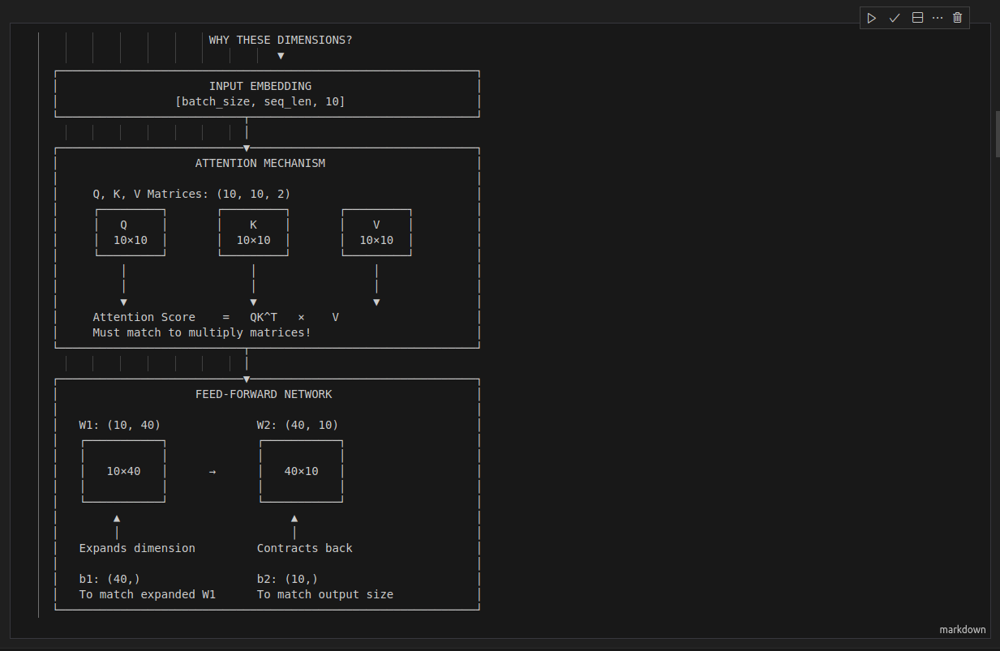

In [53]:
# Model Params
vocab_size  = len(vocab)
n_layers    = 5
n_heads     = 3
depth_model = 10

d_v = depth_model // n_heads
seq_len = 32 # Max length of the sequence


# Embeddings token ---> (vocab_size, depth_model) 
# tokens are array of actually vocab size but each expanded into depth model (each token has depth model length embedding)
# while the poitional embedding is a vector holds the possible position of each tocken (it can identify the maximum token per ff)
# the window size has 32 length
token_embedding     = np.random.normal(0, 0.02, (vocab_size, depth_model))
positional_embedding= np.random.normal(0, 0.02, (seq_len, depth_model))  # Max 1000 positions

# Attention Layer must be of shape ( model_depth x model_depth) 
q = np.random.normal(0, 0.02, (depth_model, depth_model, n_layers)).astype(np.float32) 
k = np.random.normal(0, 0.02, (depth_model, depth_model, n_layers)).astype(np.float32)
v = np.random.normal(0, 0.02, (depth_model, depth_model, n_layers)).astype(np.float32)
o = np.random.normal(0, 0.02, (depth_model, depth_model, n_layers)).astype(np.float32)

# attention_weights = [{
#     "q"                   : q,
#     "k"                   : k,
#     "v"                   : v,
#     "o"                   : o
# } for _ in range(n_layers)]

print(f"q_shape : {q.shape}, v_shape           : {v.shape}")
print(f"q_shape : {q.shape}, v_transpose_shape : {np.transpose(k, [0, 2, 1]).shape}")


# Feed-Forward Layer
W1 = np.random.normal(0, 0.02, (depth_model  ,4*depth_model, n_layers)).astype(np.float32) 
W2 = np.random.normal(0, 0.02, (4*depth_model, depth_model , n_layers)).astype(np.float32) 
b1 = np.random.normal(0, 0.02, (4*depth_model              , n_layers)).astype(np.float32) 
b2 = np.random.normal(0, 0.02, (depth_model                , n_layers)).astype(np.float32) 

print(f"W1 shape : {W1.shape}")
print(f"W2 shape : {W2.shape}")
print(f"b1 shape : {b1.shape}")
print(f"b2 shape : {b2.shape}")

q_shape : (10, 10, 5), v_shape           : (10, 10, 5)
q_shape : (10, 10, 5), v_transpose_shape : (10, 5, 10)
W1 shape : (10, 40, 5)
W2 shape : (40, 10, 5)
b1 shape : (40, 5)
b2 shape : (10, 5)


## Using Einstein Summation Notation
For more complex tensor multiplications, np.einsum offers greater flexibility:

Syntax Breakdown
Where:
```python
    # simple notation
    np.einsum('subscripts_for_inputs->subscript_for_output', *arrays)
```
* Each letter represents a dimension/axis
* Repeated indices are summed over
* The arrow -> separates input and output patterns


```python

attention_score = np.einsum("ijk,ilk->ijl", q, k) / np.sqrt(depth_model)
```

This performs:

* `q` : has shape (depth_model, depth_model, n_layers)
* `k` : has shape (depth_model, depth_model, n_layers)
* Interpretation: "For each pair of indices (i,j,m), sum the product of q[i,j,k] and k[i,k,m] over all values of k"
* Equivalent to: matrix multiplication of q and transposed k for each slice


In case of feed forward :

    for each layer in  `n_layers`:
        we want to W1(layer) * q(layer) + b1(layer)

* `*q*` has shape (depth_model, depth_model, n_layers) = (10, 10, 5)
* `*W1*` has shape (depth_model, 4*depth_model) = (10, 40)
* `*Interpretation*`: "For each pair (i,j), multiply the vector q[i,j,:] by the matrix W1"
* `*Result shape*`: (10, 10, 40)
* Equivalent to applying the feed-forward transformation to each position

# Attention
`Attention(Q, K, V) = softmax(QK^T / √d_k) × V`

In [58]:
# 10, 10, 5 , 10, 10 , 5--> 10,10,10
# i   j   k , i , l , k --> i  j  l
attention_score = np.einsum("ijk,ilk->ijl", q, k) / np.sqrt(depth_model)
# or
attention_score_raw = np.matmul(q, np.transpose(k, [0, 2, 1])) / np.sqrt(depth_model)

print(f"Attention score raw shape : {attention_score_raw.shape}")
print(f"Attention score shape : {attention_score.shape}")

Attention score raw shape : (10, 10, 10)
Attention score shape : (10, 10, 10)


In [59]:
print(attention_score_raw [0][1])
print(attention_score[0][1])


[ 3.4754255e-04 -2.9631334e-04  1.5557458e-04  4.2734912e-04
  2.2933065e-04 -2.1597126e-04  2.7356140e-04 -2.0763473e-04
 -7.5015640e-05  2.0101096e-04]
[ 3.4754255e-04 -2.9631334e-04  1.5557457e-04  4.2734912e-04
  2.2933068e-04 -2.1597126e-04  2.7356145e-04 -2.0763473e-04
 -7.5015632e-05  2.0101097e-04]


In [61]:
# Multi Head - Attention
attention_score_raw = np.matmul(q , np.transpose(k, [0, 2, 1])) / np.sqrt(depth_model)
attention_score = np.einsum("ijk,ilk->ijl", q, k) / np.sqrt(depth_model)

print(f"Attention Score shape : {attention_score.shape}")
assert np.allclose(attention_score_raw, attention_score)

mask = np.triu(np.ones((attention_score.shape[0], attention_score.shape[1])), k=1)
print(f"Mask : {mask}")
# print(f"Mask : {mask}")

# set the lower triangle to -infinity
attention_score = attention_score + (mask * -1e9 ) 
print(f"Attention Score : {attention_score}")

Attention Score shape : (10, 10, 10)
Mask : [[0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Attention Score : [[[-7.33554698e-05 -1.00000000e+09 -1.00000000e+09 -1.00000000e+09
   -1.00000000e+09 -1.00000000e+09 -1.00000000e+09 -1.00000000e+09
   -1.00000000e+09 -1.00000000e+09]
  [ 3.47542547e-04 -2.96313345e-04 -1.00000000e+09 -1.00000000e+09
   -1.00000000e+09 -1.00000000e+09 -1.00000000e+09 -1.00000000e+09
   -1.00000000e+09 -1.00000000e+09]
  [-3.72240931e-04  6.37132543e-05 -2.79251602e-04 -1.00000000e+09
   -1.00000000e+09 -1.00000000e+09 -1.00000000e+09 -1.00000000e+09
   -1.00000000e+09 -1.00000000e+09]
  [-2.69966113e-04  9.31424802e-05 -1.72611719e-04 -5.07668337e-05
   -1.00000000e+09 -1.00000000

In [62]:
attention_score[0].shape

(10, 10)

# Softmax

In [63]:
# Softmax
# we need to add a small value to avoid division by zero
epsilon = 1e-9
print(f"Attention shape : {attention_score.shape}")

x = np.exp(attention_score - np.max((attention_score), axis=-1, keepdims=True))
# print(np.sum(x, axis=-1, keepdims=True).shape)

x = x / (np.sum(x, axis=-1, keepdims=True) + epsilon)
print(f"Attention Score : {x}")

Attention shape : (10, 10, 10)
Attention Score : [[[1.         0.         0.         0.         0.         0.
   0.         0.         0.         0.        ]
  [0.50016096 0.49983904 0.         0.         0.         0.
   0.         0.         0.         0.        ]
  [0.33327456 0.33341989 0.33330555 0.         0.         0.
   0.         0.         0.         0.        ]
  [0.24995752 0.2500483  0.24998186 0.25001232 0.         0.
   0.         0.         0.         0.        ]
  [0.2000176  0.20001929 0.19995936 0.20002764 0.1999761  0.
   0.         0.         0.         0.        ]
  [0.16668745 0.16664911 0.16663294 0.16673772 0.16659987 0.16669291
   0.         0.         0.         0.        ]
  [0.14287841 0.14280952 0.14287629 0.14282428 0.14299295 0.14283149
   0.14278704 0.         0.         0.        ]
  [0.12501601 0.12498798 0.12496501 0.12502806 0.12497238 0.12500711
   0.12501368 0.12500977 0.         0.        ]
  [0.11113516 0.1110847  0.11112283 0.11114634 0.111120

In [65]:
def softmax(x):
    epsilon = 1e-9
    e_x = np.exp(x - np.max((x), axis=-1, keepdims=True))
    return e_x / (e_x.sum(axis=0) + epsilon)

attention_weights = softmax(attention_score)
print(f"Attention Score : {attention_weights.shape}")
output_score = np.einsum('ijl,ilk->ijk',attention_weights, v)
print(f"Attention Score : {output_score}")

Attention Score : (10, 10, 10)
Attention Score : [[[ 3.75578888e-03  3.26433293e-03  1.57556671e-04 -9.62197874e-04
    3.65197193e-04]
  [ 1.93728374e-03  5.17519421e-03  3.81497420e-04 -2.25796575e-04
    8.19768363e-04]
  [ 4.75885570e-03  6.36871155e-03  8.09601949e-04  1.47959445e-03
    3.40048567e-04]
  [ 4.02131613e-03  5.35036146e-03  1.53510971e-03  9.12089234e-04
    6.18995586e-04]
  [ 2.11288968e-03  6.13637803e-03  2.24302686e-03 -8.58906569e-04
   -5.41829825e-04]
  [ 4.10122895e-03  7.13368821e-03 -1.42644223e-03 -2.38251876e-03
   -4.42721386e-03]
  [ 5.68248686e-03  5.48114865e-03 -2.49818985e-04 -2.01574553e-03
   -5.34497878e-03]
  [ 9.99032072e-03  6.07219129e-03  1.22689795e-03 -1.93391939e-03
   -1.56584126e-03]
  [ 1.10379182e-02  6.38196053e-03  1.20565550e-03 -1.44662559e-03
   -2.67144082e-03]
  [ 9.75681220e-03  5.23566521e-03 -1.24002690e-03 -2.69201679e-03
   -6.19527125e-03]]

 [[-2.24544257e-03  2.31206557e-04 -4.41040844e-04 -1.66896023e-03
    1.525889

In [70]:
# Attention
def attention(q, k, v, mask=None):
    # Calculate the attention score
    attention_score = np.einsum("ijk,ilk->ijl", q, k) / np.sqrt(depth_model)
    print(f"Attention score : {attention_score.shape}")
    
    if mask is not None:
        attention_score += (mask * -1e9 )

    attention_weights = softmax(attention_score)
    print(f"Attention weights : {attention_weights.shape}")

    output = np.einsum('ijl,ilk->ijk',attention_weights, v)

    return output

# Create a mask
mask = np.triu(np.ones((attention_score.shape[0], attention_score.shape[1])), k=1)
print(f"Mask : {mask}")
# Apply the attention function
output = attention(q, k, v, mask=mask)

assert output.shape == (depth_model, depth_model, n_layers), "Output shape mismatch"
assert np.allclose(output, output_score), "Output mismatch"

print(f"Output with mask : {output}")
# Apply the attention function without mask
output_no_mask = attention(q, k, v, mask=None)
print(f"Output without mask : {output_no_mask}")

Mask : [[0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Attention score : (10, 10, 10)
Attention weights : (10, 10, 10)
Output with mask : [[[ 3.75578902e-03  3.26433289e-03  1.57556671e-04 -9.62197897e-04
    3.65197193e-04]
  [ 1.93728390e-03  5.17519470e-03  3.81497463e-04 -2.25796597e-04
    8.19768407e-04]
  [ 4.75885579e-03  6.36871206e-03  8.09601974e-04  1.47959439e-03
    3.40048602e-04]
  [ 4.02131584e-03  5.35036158e-03  1.53510971e-03  9.12088959e-04
    6.18995633e-04]
  [ 2.11288966e-03  6.13637781e-03  2.24302709e-03 -8.58906482e-04
   -5.41829970e-04]
  [ 4.10122890e-03  7.13368785e-03 -1.42644229e-03 -2.38251872e-03
   -4.42721415e-03]
  [ 5.68248658e-03  5.48114860e-03 -2.49819015e-04 -2.015

# Feed Forward

In [81]:
print(f"Output shape : {output.shape}")
print(f"W1 shape : {W1.shape}")
print(f"W2 shape : {W2.shape}")
print(f"b1 shape : {b1.shape}")
print(f"b2 shape : {b2.shape}")

Output shape : (10, 10, 5)
W1 shape : (10, 40, 5)
W2 shape : (40, 10, 5)
b1 shape : (40, 5)
b2 shape : (10, 5)


# Feed Forward

In [87]:
# 10,10,5  , 10,40,5 --> 10,40,5
# 10,40,5  , 40,10,5 --> 10,10,5
# Feed Forward
def feed_forward(x):
    x = np.einsum('ijk,ilk->ilk',x, W1) + b1
    x = np.maximum(0, x)  # ReLU activation
    x = np.einsum('ijk,jlk->ilk',x, W2) + b2
    return x
# Apply the feed forward function
output = feed_forward(output)
print(f"Output : {output.shape}")

Output : (10, 10, 5)


# Backpropagation

In [95]:
def loss_function(y_true, y_pred):
    # Calculate the loss
    loss = np.mean(np.square(y_true - y_pred))
    return loss
# Apply the loss function
y_true = np.random.normal(0, 0.02, (vocab_size, depth_model))
y_pred = np.random.normal(0, 0.02, (vocab_size, depth_model))
loss = loss_function(y_true, y_pred)
# Loss Function
print(f"Loss : {loss}")

Loss : 0.0007998011416766185


In [107]:
grad = 2 * (y_pred - y_true) / y_true.size
grad = np.einsum('ij,ij->ij', y_pred , - y_true)
print(grad.shape)

(599, 10)


In [109]:
# Backpropagation
def backpropagation(x, y_true, y_pred, **kwargs):
    # Unpack the weights
    W1, W2, b1, b2 = kwargs['weights']
    # Calculate the gradients
    grad = np.einsum('ij,ij->ij', y_pred , - y_true) / y_true.size
    # Update the weights
    W1 -= learning_rate * np.matmul(x.T, grad)
    W2 -= learning_rate * np.matmul(grad.T, x)
    b1 -= learning_rate * np.sum(grad, axis=0)
    b2 -= learning_rate * np.sum(grad, axis=1)
    return grad
# Apply the backpropagation function
learning_rate = 0.01
x      =   np.random.normal(0, 0.02, (vocab_size, depth_model))
y_true =   np.random.normal(0, 0.02, (vocab_size, depth_model))
y_pred =   np.random.normal(0, 0.02, (vocab_size, depth_model))
grad = backpropagation(x, y_true, y_pred, weights=[W1, W2, b1, b2])
print(f"Grad : {grad}")
# Training Loop

ValueError: operands could not be broadcast together with shapes (10,40,5) (10,10) (10,40,5) 

In [ ]:

def train_model(data, num_epochs=10):
    for epoch in range(num_epochs):
        for batch in data:
            # Forward pass
            y_pred = model(batch)
            # Calculate loss
            loss = loss_function(batch, y_pred)
            # Backward pass
            grad = backpropagation(batch, y_pred, loss)
            # Update weights
            W1 -= learning_rate * np.matmul(batch.T, grad)
            W2 -= learning_rate * np.matmul(grad.T, batch)
            b1 -= learning_rate * np.sum(grad, axis=0)
            b2 -= learning_rate * np.sum(grad, axis=1)
    return model

# Apply the training loop
data = np.random.normal(0, 0.02, (vocab_size, depth_model))
num_epochs = 10
model = train_model(data, num_epochs)
print(f"Model : {model}")
# Save the model
def save_model(model, filename):
    with open(filename, 'wb') as f:
        np.save(f, model)
    
# Apply the save model function
filename = "model.npy"
save_model(model, filename)
# Load the model
def load_model(filename):
    with open(filename, 'rb') as f:
        model = np.load(f)
    return model

# Apply the load model function
model = load_model(filename)
print(f"Model : {model}")
# Evaluate the model
def evaluate_model(model, data):
    # Calculate the accuracy
    accuracy = np.mean(np.equal(model, data))
    return accuracy

# Apply the evaluate model function
accuracy = evaluate_model(model, data)
print(f"Accuracy : {accuracy}")
# Generate text

def generate_text(model, seed_text, length=100):
    generated_text = seed_text
    for _ in range(length):
        # Predict the next character
        next_char = model(generated_text)
        generated_text += next_char
    return generated_text
# Apply the generate text function
seed_text = "The quick brown fox"
length = 100
generated_text = generate_text(model, seed_text, length)
print(f"Generated text : {generated_text}")
# Save the generated text
def save_generated_text(generated_text, filename):
    with open(filename, 'w') as f:
        f.write(generated_text)
# Apply the save generated text function    

Mask : [[0. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 1. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 1. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 1. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 1. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 1. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]
Mask : [[-0.e+00 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -0.e+00 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -0.e+00 -0.e+00 -1.e+09 -1.e+09 -1.e+09 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -1.e+09 -1.e+09 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -1.e+09 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -1.e+09 -1.e+09
  -1.e+09]
 [-0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -0.e+00 -0

ValueError: matmul: Input operand 1 does not have enough dimensions (has 0, gufunc core with signature (n?,k),(k,m?)->(n?,m?) requires 1)

In [ ]:
#
# Masking
mask = np.triu(np.ones((attention_score.shape[0], attention_score.shape[1])), k=1).astype(np.bool_)
print(f"Mask :\n{mask}")
attention_score = np.where(mask, -np.inf, attention_score)
print(f"Attention Score :\n{attention_score}")
attention_score = np.where(np.isnan(attention_score), -np.inf, attention_score)
print(f"Attention Score :\n{attention_score}")
attention_score = np.exp(attention_score - np.max(attention_score, axis=-1, keepdims=True))
attention_score = attention_score / (np.sum(attention_score, axis=-1, keepdims=True) + 1e-9)
attention_output = np.matmul(attention_score, v)


Mask :
[[False  True  True  True  True  True  True  True  True  True]
 [False False  True  True  True  True  True  True  True  True]
 [False False False  True  True  True  True  True  True  True]
 [False False False False  True  True  True  True  True  True]
 [False False False False False  True  True  True  True  True]
 [False False False False False False  True  True  True  True]
 [False False False False False False False  True  True  True]
 [False False False False False False False False  True  True]
 [False False False False False False False False False  True]
 [False False False False False False False False False False]]
Attention Score :
[[[-1.10320061e-04            -inf            -inf            -inf
              -inf            -inf            -inf            -inf
              -inf            -inf]
  [-3.10622269e-07  1.31902376e-04            -inf            -inf
              -inf            -inf            -inf            -inf
              -inf            -inf]
  [-

In [ ]:
# 